# Proyecto 1 Inteligencia de negocios <br>
<br>
Juan Nicolás Bolaños - 201911676 (Random Forest) <br>
Juan Pablo Sarmiento - 201914487 (Logistic Regresion) <br>
Juan José Ochoa - 201913552 (Naive Bayes)

## 1. Instalación e importanción de librerías.


In [1]:
# Importa la libreria 
import nltk
# Descarga paquetes adicionales

In [2]:
# Punkt permite separar un texto en frases.
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Nicolas\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
# Descarga todas las palabras vacias, es decir, aquellas que no aportan nada al significado del texto
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Nicolas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [1]:
# Importación de librerias
seed = 161
import pandas as pd
import numpy as np

import re
from tqdm import tqdm
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud,STOPWORDS

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn import preprocessing

import scikitplot.metrics as skplt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings("ignore")


## 2. Perfilamiento y entendimiento de los datos



#### Lectura de los datos.

In [2]:
# Uso de la libreria pandas para la lectura de archivos
data=pd.read_csv('Reviews.csv', sep=',', encoding = 'utf-8')
# Asignación a una nueva variable de los datos leidos
data_t=data
data_t.sample(10)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
454946,454947,B001G604YE,AI2K24GZ28RSL,Dr Daddy,0,0,5,1323648000,Best chocolate ever,I purchased the 10 pound box of Ghirardelli Ch...
142347,142348,B001ELL6RU,A1DXWWYARWE2FG,VeganDude,0,0,5,1287273600,Protein for Vegans,"This is Kasha, for those of Eastern European g..."
229337,229338,B000GGOEGO,A3FJU0QGP1IUEO,VLA,2,3,5,1299283200,Tase great! :],I really like these Ill probably purchase thes...
230669,230670,B000NGQ9VK,A1HN0WW8H4MYC6,Nicholas Moses,0,0,5,1348963200,The king of energy drinks!,"I started drinking Monsters in high school, us..."
59054,59055,B002HQLY7S,ACUULDJXTLTE7,"Lisa Lamb ""Lisa""",0,0,4,1303516800,Butter Toffee K-cups,ordering another pack of 50. Smells wonderful ...
541892,541893,B000FKQD42,A13RKMUEYBTLEQ,Sue Garrett,0,0,5,1251936000,Altoids Ginger Mints,My Mom Uses these for her nausea that comes fr...
499320,499321,B002U9U3TW,A1Q39QG0L0Q0GJ,"BJMC ""bless you""",1,1,5,1269648000,The Best Dark Chocolate Brownies,We bought a box of six boxes of these and they...
116055,116056,B000EXGKVQ,A159E7Y2WLW9Q0,Dtwn,0,0,4,1258416000,Not bad,"It makes a decent amount of food, but if you'r..."
216853,216854,B008EG5ADY,A2FYK4HWXZRLPN,Gregory McMahan,0,0,4,1340668800,A Worthwhile Purchase From The Quaker People,"As someone who was raised on Quaker oatmeal, I..."
449480,449481,B001A3GAKU,AZNSJP2OIXV6M,Skatejorer,0,0,5,1348444800,Love Colorado Spice Company Ground Ancho,This review is after my second 32 ounce contai...


In [7]:
textos = data_t.copy()
textos['Conteo'] = [len(x) for x in textos['Text']]
textos['Moda'] = [max(set(x.split(' ')), key = x.split(' ').count) for x in textos['Text']]
textos['Max'] = [[max([len(x) for x in i.split(' ')])][0] for i in textos['Text']]
textos['Min'] = [[min([len(x) for x in i.split(' ')])][0] for i in textos['Text']]
textos.sample(10)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Conteo,Moda,Max,Min
200706,200707,B0006B6U34,A20O3A1UDDXQPX,Samsara,0,2,3,1334534400,Mystery Gift!!!!,I was told that the basket was very nice ...AF...,330,I,17,0
302583,302584,B000BF3AJ2,A1Q6E9ROTW2MFF,Carol,1,2,4,1195516800,Fri Chik,A great meat substitute - good in oriental sti...,139,-,10,0
514250,514251,B0081X097M,A6MRNC2O9CQ23,Pizzlehp,0,0,5,1343260800,Chill out and smile :),When Metromint claims to cool you off....it re...,181,I,10,1
364651,364652,B000PDY3HI,A10X3S8SDWOS30,Isdageek,0,0,5,1313539200,Awesome popcorn! Easy to use kits!,The popcorn tastes great and these kits are ea...,125,popcorn,8,0
17415,17416,B0045Z6K50,AYA27SRXFOXP7,Kari,0,0,5,1327795200,Great choice!,"Very smooth coffee, no bitter aftertaste, this...",156,Shipment,11,2
283843,283844,B004EE0TYK,A14Y76M66GLVZF,drock,0,0,2,1330214400,Just weak hot chocolate,"Despite the name, this is just hot chocolate, ...",184,,10,0
361340,361341,B000KL57E8,A14H5GNH2EIPAC,"Kuromame's Mommy ""Rose""",1,1,2,1297641600,Dog treats,My Shiba Inu ate the first one -- the second t...,232,the,11,1
453447,453448,B0029XLH4Y,A8W8A8SXN3MGD,emunoz,0,1,3,1295827200,Price Increase,The price just increased by about $6 for 50 k-...,255,about,13,0
195505,195506,B00283H2HQ,A3P8X2YDR26QHS,M. Vasilescu,2,2,5,1259971200,"Bar none, the most flavourful rum essence I've...","For some reason, this particular rum essence h...",379,I,11,0
433508,433509,B001XWNELQ,A323D7ZROXO949,"K. Lamb ""worship leader""",5,5,5,1257465600,Simply The Best!,This organic onion powder is fabulous. I use i...,297,is,11,1


In [8]:
data_t.shape

(568454, 10)

In [9]:
data_t.isna().sum()

Id                         0
ProductId                  0
UserId                     0
ProfileName               16
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                   27
Text                       0
dtype: int64

In [10]:
fig = px.histogram(data_t, x="Score")
fig.update_traces(marker_color="rgb(128,128,255)",marker_line_color='black',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Score Count')
fig.show()

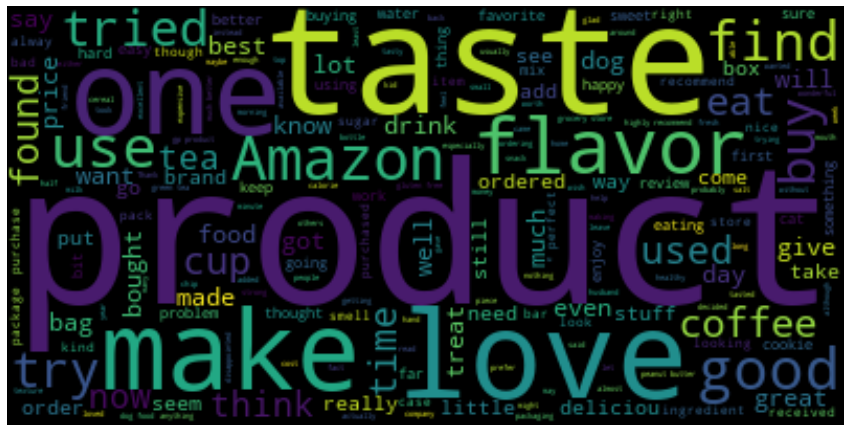

In [4]:
stopwords = set(STOPWORDS)
stopwords.update(["br", "href"])
textt = " ".join(review for review in data_t.Text)
wordcloud = WordCloud(stopwords=stopwords).generate(textt)
plt.figure(figsize = (15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud1.png')
plt.show()

## 3. Preparación de datos

In [3]:
data_clean = data_t.copy()
data_clean = data_clean.dropna(subset=['Summary'])

In [12]:
data_clean.isna().sum()

Id                         0
ProductId                  0
UserId                     0
ProfileName               16
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                    0
Text                       0
dtype: int64

In [13]:
data_clean = data_clean.drop(data_clean[data_clean.Score == 3].index)

In [14]:
fig = px.histogram(data_clean, x="Score")
fig.update_traces(marker_color="rgb(128,128,255)",marker_line_color='black',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Score Count')
fig.show()

In [15]:
data_clean.shape

(525789, 10)

In [4]:
data_clean['rating'] = data_clean['Score'].apply(lambda rating : 1 if rating > 3 else 0)
positive = data_clean[data_clean['rating'] == 1]
negative = data_clean[data_clean['rating'] == 0]

<AxesSubplot:xlabel='rating', ylabel='count'>

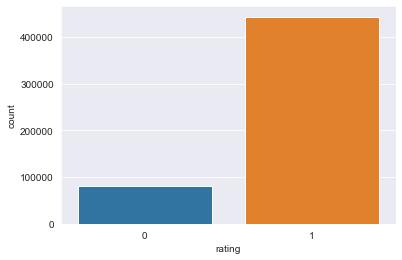

In [55]:
sns.countplot(x= data_clean['rating'])

Positive Words:




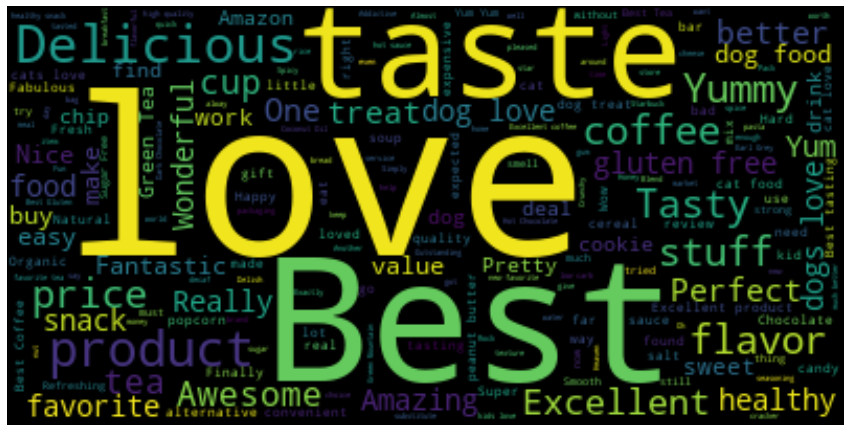

In [9]:
stopWords = set(STOPWORDS)
stopWords.update(["br", "href","good","great"])  
pos = " ".join(review for review in positive.Summary)
wordcloud2 = WordCloud(stopwords=stopWords).generate(pos)
plt.figure(figsize = (15,10))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
print("Positive Words:\n\n")
plt.show()

Negative Words:




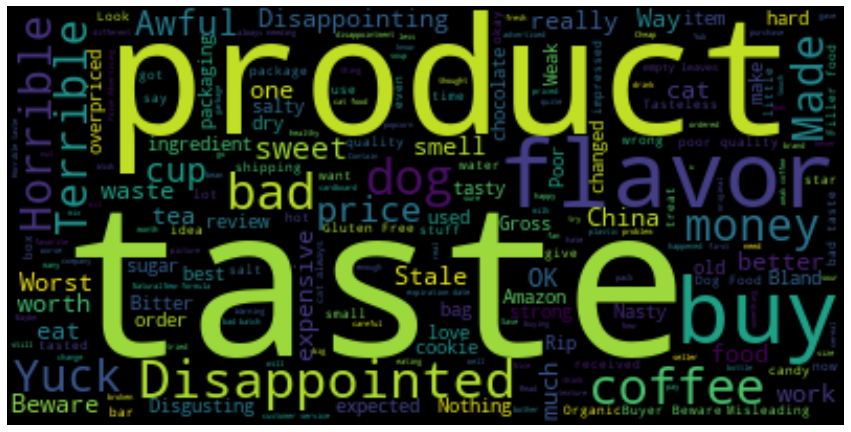

In [10]:
neg = " ".join(review for review in negative.Summary)
wordcloud3 = WordCloud(stopwords=stopWords).generate(neg)
plt.figure(figsize = (15,10))
plt.imshow(wordcloud3, interpolation='bilinear')
plt.axis("off")
print("Negative Words:\n\n")
plt.show()

In [5]:
sno = nltk.stem.SnowballStemmer('english')
stops = set(stopwords.words("english"))
def cleanhtml(sentence): 
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext

def cleanpunc(sentence): 
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned
    
def final_sentence(text):
    
    text = text.split()
    text = [cleanhtml(x) for x in text]
    text = [cleanpunc(x) for x in text]
    
    def test(word):
        if word.isalpha() and len(word) > 2 and word.lower() not in stops:
            s=(sno.stem(word.lower()))
            return s
        else:
            pass
    
    text = [test(x) for x in text if test(x)]

    
    return ' '.join(text)

In [6]:
tqdm.pandas()

data_clean["CleanedText"] = data_clean['Text'].progress_apply(final_sentence)
print(data_clean.shape)
data_clean.head()

100%|██████████| 568427/568427 [10:30<00:00, 900.88it/s] 

(568427, 12)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,rating,CleanedText
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1,bought sever vital can dog food product found ...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0,product arriv label jumbo salt peanut actual s...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,1,confect around pillowi citrus gelatin nut case...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0,look secret ingredi robitussin believ found go...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,1,great taffi great wide assort yummi deliveri t...


Exportación de datos

In [132]:
filename = 'datosProcesados.csv'
data_clean.to_csv(filename)

## 4. Modelos

### 4.1 Regresión logísitica

In [110]:
data_lr = data_clean.copy()
X_train, X_test, y_train, y_test = train_test_split(data_lr['CleanedText'], data_lr['rating'], test_size = 0.2)
cv = CountVectorizer(token_pattern=r'\b\w+\b')
X_train =  cv.fit_transform(X_train)
X_test = cv.transform(X_test)

In [111]:
lr = LogisticRegression()
lr.fit(X_train,y_train)

LogisticRegression()

In [112]:
predictions = lr.predict(X_test)

In [113]:
acc = accuracy_score(predictions, y_test)
print(f"Model Accuracy = {round(acc*100,2)}%")

Model Accuracy = 92.01%


In [69]:
new = np.asarray(y_test)
print('Confusion Matrix:\n\n', confusion_matrix(predictions,y_test))

Confusion Matrix:

 [[10503  2393]
 [ 5808 86454]]


In [70]:
print('Classification report:\n\n', classification_report(predictions,y_test))

Classification report:

               precision    recall  f1-score   support

           0       0.64      0.81      0.72     12896
           1       0.97      0.94      0.95     92262

    accuracy                           0.92    105158
   macro avg       0.81      0.88      0.84    105158
weighted avg       0.93      0.92      0.93    105158



<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

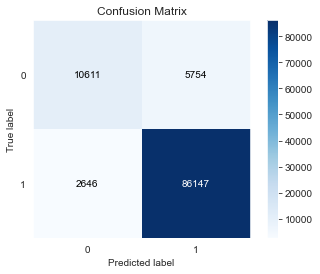

In [114]:
skplt.plot_confusion_matrix(y_test,predictions)

### 4.2 Random Forest

In [102]:
data_rf = data_clean.copy()

In [103]:
X = data_rf['CleanedText'] 
y = data_rf['rating'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [104]:
vectorizer = TfidfVectorizer()
vectorizer_tfidf = vectorizer.fit(X_train)
X_train = vectorizer_tfidf.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

In [105]:
clf = RandomForestClassifier() 
clf.fit(X_train, y_train)
preds = clf.predict(X_test)


In [106]:
acc = accuracy_score(preds, y_test)
print(f"Model Accuracy = {round(acc*100,2)}%")

Model Accuracy = 92.12%


In [107]:
print('Classification report:\n\n', classification_report(preds,y_test))

Classification report:

               precision    recall  f1-score   support

           0       0.50      0.98      0.66      8326
           1       1.00      0.92      0.96     96832

    accuracy                           0.92    105158
   macro avg       0.75      0.95      0.81    105158
weighted avg       0.96      0.92      0.93    105158



<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

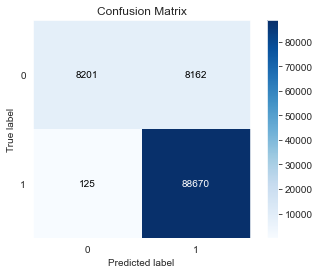

In [108]:
skplt.plot_confusion_matrix(y_test,preds)

### 4.3 Naive Bayes

In [7]:
data_nb = data_clean.copy()

In [8]:
def Text_Into_Vector(model,data):
    model_vect = model(ngram_range=(1,2)) #in scikit-learn
    final_array = model_vect.fit_transform(data.values)
    
    return model_vect, final_array

def Split_data(x_vec, y_vec):
    X_train, X_test, Y_train, Y_test = train_test_split(x_vec, y_vec, test_size=.33, random_state=0)
    X_tr, X_cv, Y_tr, Y_cv = train_test_split(X_train, Y_train, test_size=.33, random_state=0)
    return X_tr, X_cv, X_test, Y_tr, Y_test, Y_cv, X_train, Y_train

def Normalization(train, cv, test):
    train=preprocessing.normalize(train)
    cv=preprocessing.normalize(cv)
    test=preprocessing.normalize(test)
    
    return train, cv, test

In [14]:
def Multinomial_NB(X_train,X_cv,Y_train,Y_cv):
    best_alpha=0
    max_roc_auc=-1
    pred_cv = []
    pred_train = []
    alpha=[10000,5000,1000,500,100,50,10,5,1,0.5,0.1,0.05,0.01,0.005,0.001,0.0005,0.0001,0.00005,0.00001]

    for i in alpha:
        mulbnb = MultinomialNB(alpha=i)
        mulbnb.fit(X_train,Y_train)
        probs = mulbnb.predict_proba(X_cv)[:,1]     
        prob = mulbnb.predict_proba(X_train)[:,1]

        auc_score_cv = roc_auc_score(Y_cv,probs)
        auc_score_train = roc_auc_score(Y_train,prob)

        pred_cv.append(auc_score_cv)
        pred_train.append(auc_score_train)

        if(max_roc_auc<auc_score_cv):
            max_roc_auc=auc_score_cv
            best_alpha=i
    print(best_alpha)
    return best_alpha

def Testing_model(X_train,Y_train,X_test,Y_test,best_alpha):
    
    bnb = MultinomialNB(alpha = best_alpha, fit_prior=True, class_prior=None)
    bnb.fit(X_train,Y_train)
    probs = bnb.predict_proba(X_test)[:,1]

    roc_auc = roc_auc_score(Y_test,probs)

    prediction=bnb.predict(X_test)
    skplt.plot_confusion_matrix(Y_test,prediction)

    print("macro f1 score for data :",metrics.f1_score(Y_test, prediction, average = 'macro'))
    print("micro f1 score for data:",metrics.f1_score(Y_test, prediction, average = 'micro'))
    print("hamming loss for data:",metrics.hamming_loss(Y_test,prediction))
    print("\n")
    print("Precision recall report for data:\n",metrics.classification_report(Y_test, prediction))
    print("\n")
    
    return bnb,roc_auc

In [10]:
BOW, X = Text_Into_Vector(CountVectorizer,data_nb['CleanedText'])

In [11]:
X_tr, X_cv, X_test, Y_tr, Y_test, Y_cv, X_train, Y_train = Split_data(X, data_nb['rating'])

In [12]:
X_tr, X_cv, X_test = Normalization(X_tr, X_cv, X_test)

In [15]:
best_alpha_bow = Multinomial_NB(X_tr,X_cv,Y_tr,Y_cv)

0.01


macro f1 score for data : 0.8407135013371578
micro f1 score for data: 0.8982732792766858
hamming loss for data: 0.10172672072331419


Precision recall report for data:
               precision    recall  f1-score   support

           0       0.83      0.68      0.74     41234
           1       0.91      0.96      0.94    146347

    accuracy                           0.90    187581
   macro avg       0.87      0.82      0.84    187581
weighted avg       0.89      0.90      0.89    187581





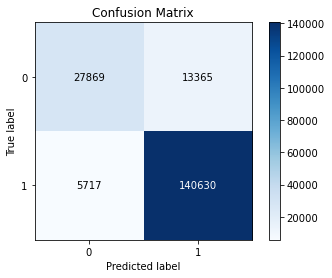

In [16]:
NB_bow, roc_auc_bow = Testing_model(X_tr,Y_tr,X_test,Y_test,best_alpha_bow)